<a href="https://colab.research.google.com/github/Shivani11032006/codes/blob/main/ElectricMotorPrediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
file_path = "/content/motor_data_100000_rows.csv"

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.svm import SVR
import xgboost as xgb


In [7]:
df = pd.read_csv(file_path)
df

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,56.853619,0.446974,149.322118,239.761094,3014.825236,40.013705,0.839609,1.679990,0.114625,0.642452,0.173706,0.995592,107.0
1,58.761100,0.725229,110.712491,152.469241,4190.807418,83.610075,1.468709,1.693692,0.554240,0.631679,0.255998,0.463637,192.0
2,52.548886,0.819306,140.051980,197.981683,3248.766600,94.188757,0.673312,0.754447,0.481255,0.804713,0.901008,0.746974,146.0
3,36.817317,0.518878,121.010177,219.382262,4734.804304,82.285024,1.566802,1.706549,0.889426,0.228397,0.449994,0.253302,135.0
4,22.388087,0.356189,133.547738,209.882312,4428.614807,87.174055,0.789857,1.659429,0.294209,0.345616,0.134764,0.568964,179.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4547,46.908004,0.173445,110.046905,182.927040,3725.833788,93.762317,1.063534,0.840591,0.118277,0.821995,0.557941,0.737739,146.0
4548,25.636977,0.463435,85.868265,159.780497,4086.784475,52.483280,1.373151,1.515128,0.170289,0.145759,0.445862,0.531463,154.0
4549,40.126052,0.447098,107.911439,175.517964,3268.308333,95.453775,1.368981,1.187241,0.137085,0.465132,0.657884,0.911492,160.0
4550,58.472140,0.564696,81.929939,199.334787,1267.021468,41.240298,1.077402,1.418951,0.294571,0.111925,0.449029,0.458068,180.0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4552 entries, 0 to 4551
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ambient         4552 non-null   float64
 1   coolant         4552 non-null   float64
 2   u_d             4552 non-null   float64
 3   u_q             4552 non-null   float64
 4   motor_speed     4552 non-null   float64
 5   torque          4552 non-null   float64
 6   i_d             4551 non-null   float64
 7   i_q             4551 non-null   float64
 8   pm              4551 non-null   float64
 9   stator_yoke     4551 non-null   float64
 10  stator_tooth    4551 non-null   float64
 11  stator_winding  4551 non-null   float64
 12  profile_id      4551 non-null   float64
dtypes: float64(13)
memory usage: 462.4 KB


In [9]:
df.isnull().sum()

,0
ambient,0
coolant,0
u_d,0
u_q,0
motor_speed,0
torque,0
i_d,1
i_q,1
pm,1
stator_yoke,1


In [10]:
df.head()


,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,56.853619,0.446974,149.322118,239.761094,3014.825236,40.013705,0.839609,1.679990,0.114625,0.642452,0.173706,0.995592,107.0
1,58.761100,0.725229,110.712491,152.469241,4190.807418,83.610075,1.468709,1.693692,0.554240,0.631679,0.255998,0.463637,192.0
2,52.548886,0.819306,140.051980,197.981683,3248.766600,94.188757,0.673312,0.754447,0.481255,0.804713,0.901008,0.746974,146.0
3,36.817317,0.518878,121.010177,219.382262,4734.804304,82.285024,1.566802,1.706549,0.889426,0.228397,0.449994,0.253302,135.0
4,22.388087,0.356189,133.547738,209.882312,4428.614807,87.174055,0.789857,1.659429,0.294209,0.345616,0.134764,0.568964,179.0


In [11]:
# Drop unnecessary columns like 'profile_id' since they are session-specific and should not be used for prediction
df = df.drop(columns=['profile_id'])

# Fill missing values using forward-fill or median imputation
df = df.fillna(df.median())

# Check for any remaining missing values
df.isnull().sum()

# Define feature columns and target column (motor_speed)
X = df.drop(columns=['motor_speed'])
y = df['motor_speed']

# Split the dataset into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [12]:
df = df.fillna(df.median())

In [13]:
df.isnull().sum()


,0
ambient,0
coolant,0
u_d,0
u_q,0
motor_speed,0
torque,0
i_d,0
i_q,0
pm,0
stator_yoke,0


In [14]:
X = df.drop(columns=['motor_speed'])
y = df['motor_speed']

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [17]:
r = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [16]:
linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train)

LinearRegression()

In [18]:
y_pred_lr = linear_model.predict(X_test_scaled)

In [19]:
mae_lr = mean_absolute_error(y_test, y_pred_lr)
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred_lr))
r2_lr = r2_score(y_test, y_pred_lr)


In [20]:
print(f'Linear Regression - MAE: {mae_lr}, RMSE: {rmse_lr}, R2: {r2_lr}')

Linear Regression - MAE: 1028.9431806358912, RMSE: 1174.4895506422777, R2: -0.009486258816711057


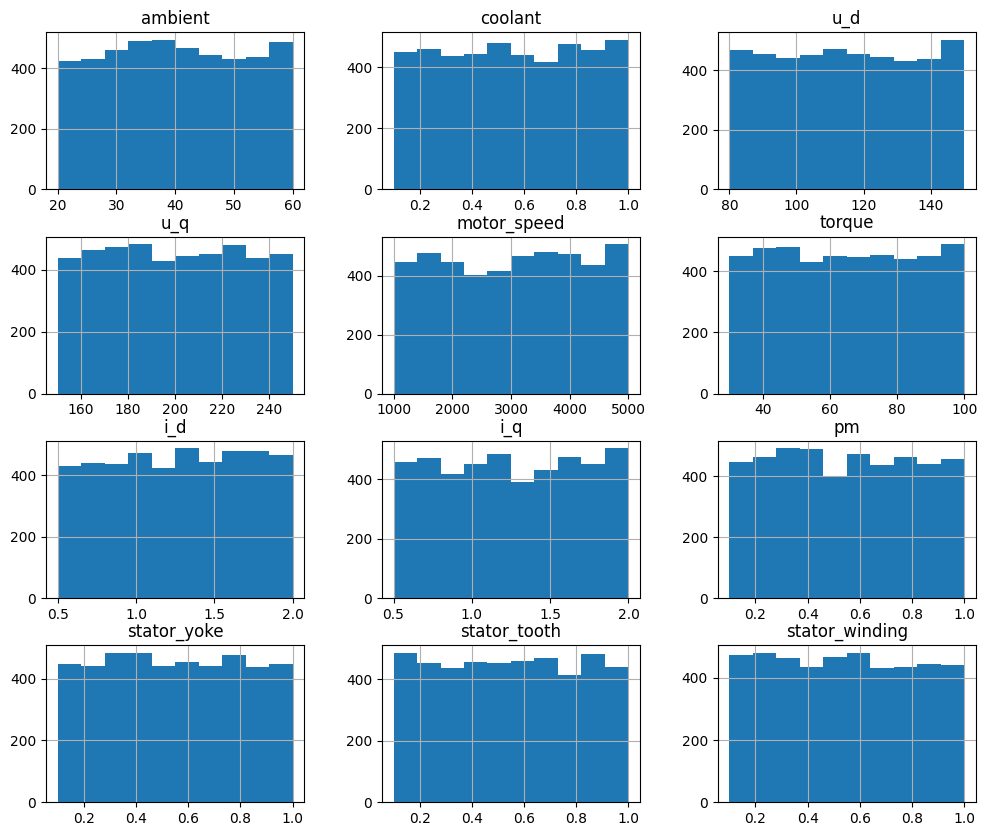

In [21]:
df.hist(figsize=(12, 10))
plt.show()

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4552 entries, 0 to 4551
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ambient         4552 non-null   float64
 1   coolant         4552 non-null   float64
 2   u_d             4552 non-null   float64
 3   u_q             4552 non-null   float64
 4   motor_speed     4552 non-null   float64
 5   torque          4552 non-null   float64
 6   i_d             4552 non-null   float64
 7   i_q             4552 non-null   float64
 8   pm              4552 non-null   float64
 9   stator_yoke     4552 non-null   float64
 10  stator_tooth    4552 non-null   float64
 11  stator_winding  4552 non-null   float64
dtypes: float64(12)
memory usage: 426.9 KB


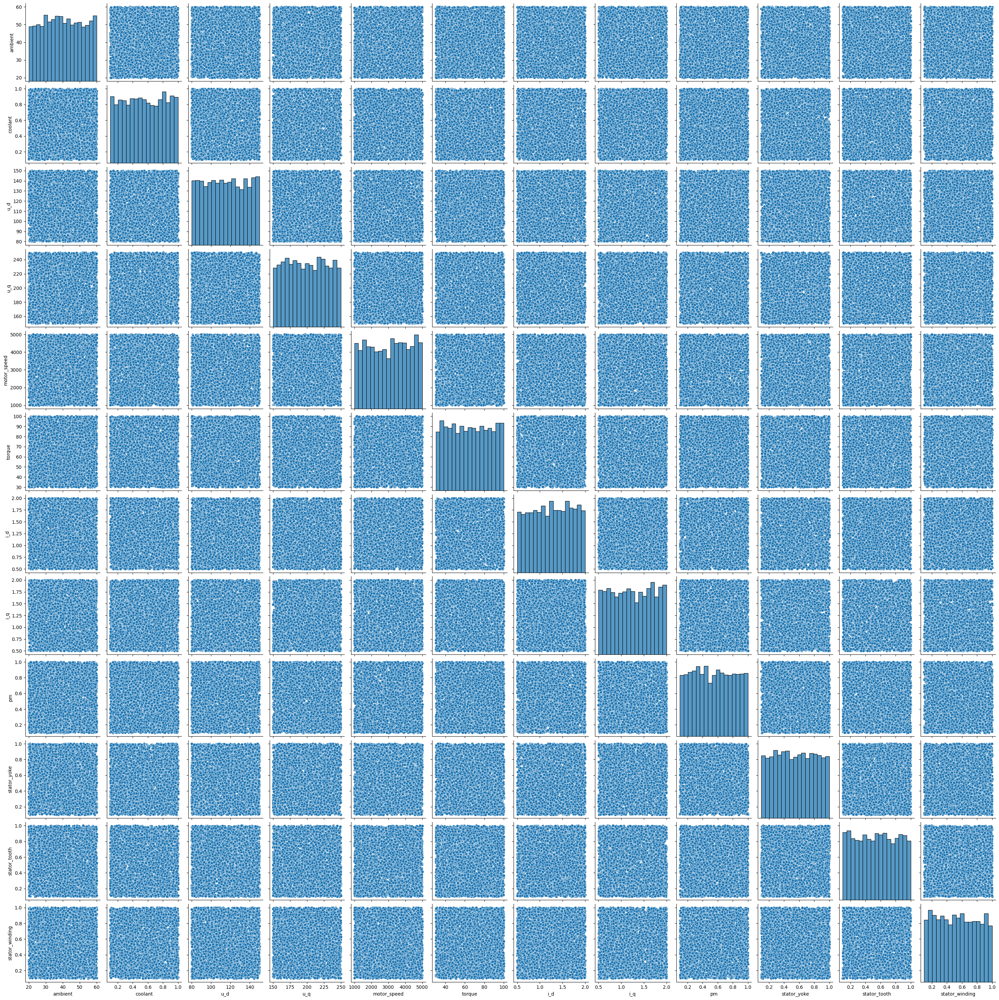

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df)
plt.show()

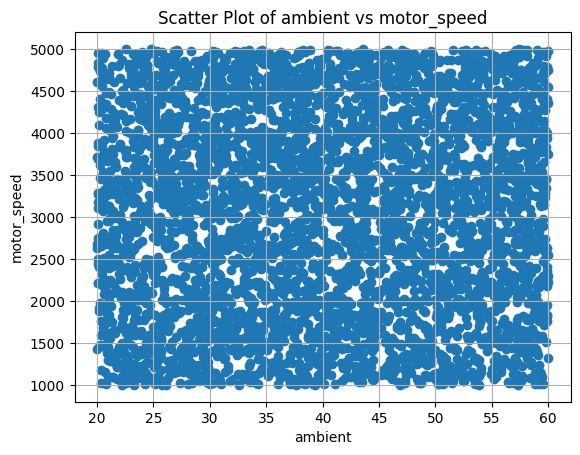

In [24]:
plt.scatter(df['ambient'], df['motor_speed'])
plt.xlabel('ambient')
plt.ylabel('motor_speed')
plt.title('Scatter Plot of ambient vs motor_speed')
plt.grid()
plt.show()

In [25]:
print(df.isnull().sum())

ambient           0
coolant           0
u_d               0
u_q               0
motor_speed       0
torque            0
i_d               0
i_q               0
pm                0
stator_yoke       0
stator_tooth      0
stator_winding    0
dtype: int64


In [26]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[['ambient', 'motor_speed']] = scaler.fit_transform(df[['ambient', 'motor_speed']])
print(df.head())


    ambient   coolant         u_d         u_q  motor_speed     torque  \
0  0.921677  0.446974  149.322118  239.761094     0.503755  40.013705   
1  0.969383  0.725229  110.712491  152.469241     0.797785  83.610075   
2  0.814016  0.819306  140.051980  197.981683     0.562247  94.188757   
3  0.420570  0.518878  121.010177  219.382262     0.933801  82.285024   
4  0.059696  0.356189  133.547738  209.882312     0.857244  87.174055   

        i_d       i_q        pm  stator_yoke  stator_tooth  stator_winding  
0  0.839609  1.679990  0.114625     0.642452      0.173706        0.995592  
1  1.468709  1.693692  0.554240     0.631679      0.255998        0.463637  
2  0.673312  0.754447  0.481255     0.804713      0.901008        0.746974  
3  1.566802  1.706549  0.889426     0.228397      0.449994        0.253302  
4  0.789857  1.659429  0.294209     0.345616      0.134764        0.568964  


<Figure size 1000x600 with 0 Axes>

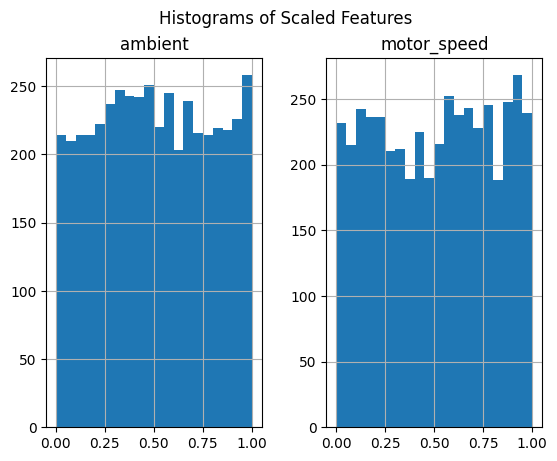

In [27]:
plt.figure(figsize=(10,6))
df[['ambient', 'motor_speed']].hist(bins=20)
plt.suptitle('Histograms of Scaled Features')
plt.show()

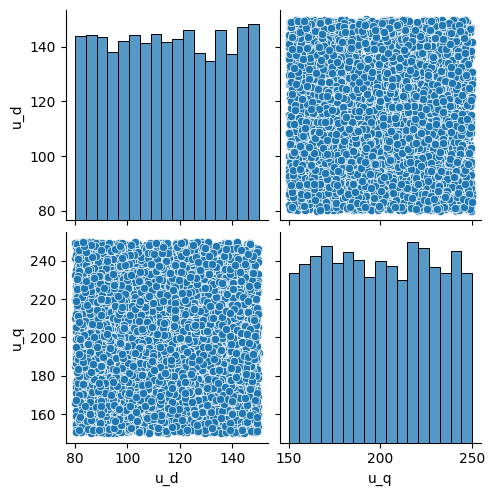

In [28]:
sns.pairplot(df[['u_d',	'u_q']])
plt.show()


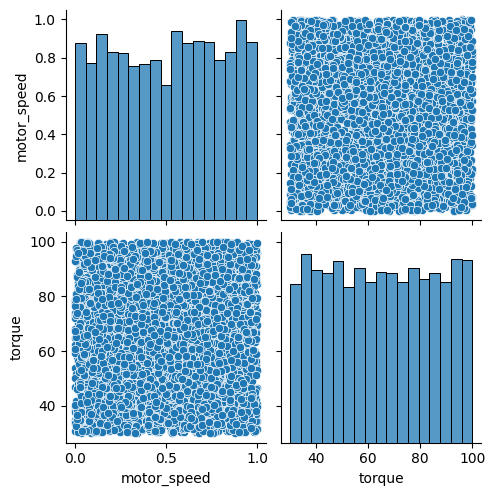

In [29]:
sns.pairplot(df[['motor_speed',	'torque']])
plt.show()

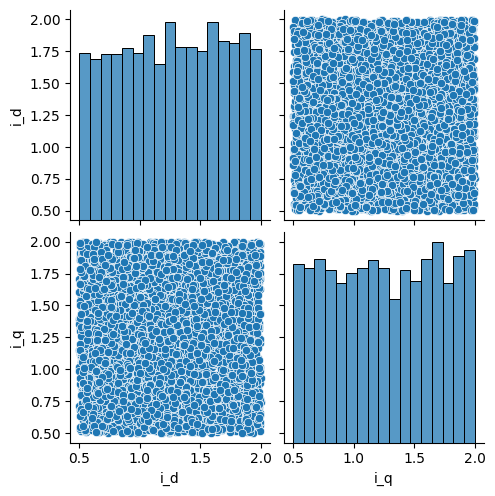

In [30]:
sns.pairplot(df[['i_d','i_q']])
plt.show()


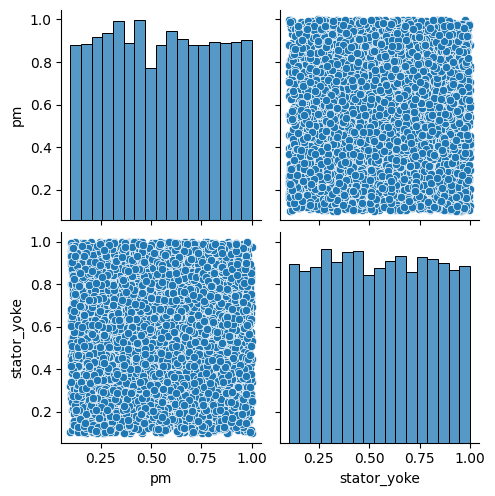

In [31]:
sns.pairplot(df[['pm',	'stator_yoke']])
plt.show()


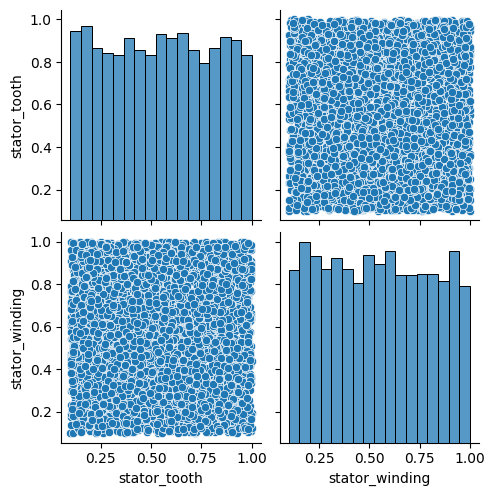

In [32]:
sns.pairplot(df[['stator_tooth',	'stator_winding']])
plt.show()


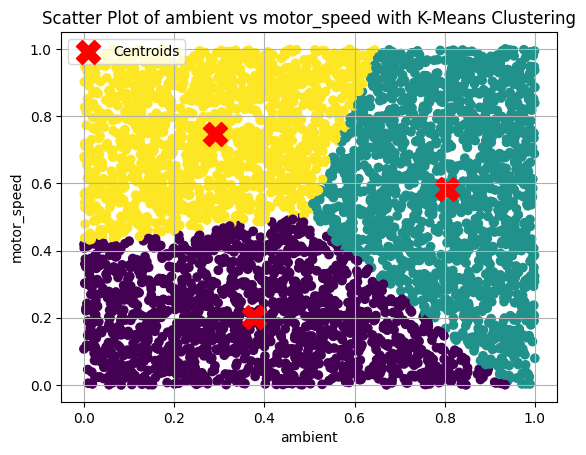

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Assuming 'df' is your DataFrame containing 'ambient' and 'motor_speed' columns

# Select the features for clustering
X = df[['ambient', 'motor_speed']].values

# Determine the optimal number of clusters (e.g., using the elbow method)
# ... (Code for determining optimal k) ...

# Perform k-means clustering with the determined k
k = 3  # Replace with the optimal k value
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X)

# Get cluster assignments for each data point
cluster_labels = kmeans.labels_

# Add cluster labels to the DataFrame
df['cluster'] = cluster_labels

# Visualize the clusters on a scatter plot
plt.scatter(df['ambient'], df['motor_speed'], c=df['cluster'], cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', marker='X', label='Centroids')
plt.xlabel('ambient')
plt.ylabel('motor_speed')
plt.title('Scatter Plot of ambient vs motor_speed with K-Means Clustering')
plt.grid()
plt.legend()
plt.show()

In [34]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the dataset
df = pd.read_csv("/content/motor_data_100000_rows.csv")

# 1. Interaction Features: Create new features by multiplying existing ones
df['ambient_x_torque'] = df['ambient'] * df['torque']
df['i_d_x_i_q'] = df['i_d'] * df['i_q']

# 2. Polynomial Features: Capture non-linear relationships
df['ambient_squared'] = df['ambient'] ** 2
df['torque_cubed'] = df['torque'] ** 3

# 3. Domain-Specific Features: Create features based on your knowledge
# Example: Calculate total resistance using physics formulas if applicable

# 4. Feature Scaling (using StandardScaler)
# Select numerical features for scaling
numerical_features = ['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed',
                     'torque', 'i_d', 'i_q', 'pm', 'stator_yoke',
                     'stator_tooth', 'stator_winding', 'ambient_x_torque',
                     'i_d_x_i_q', 'ambient_squared', 'torque_cubed']
scaler = StandardScaler()

df[numerical_features] = scaler.fit_transform(df[numerical_features])



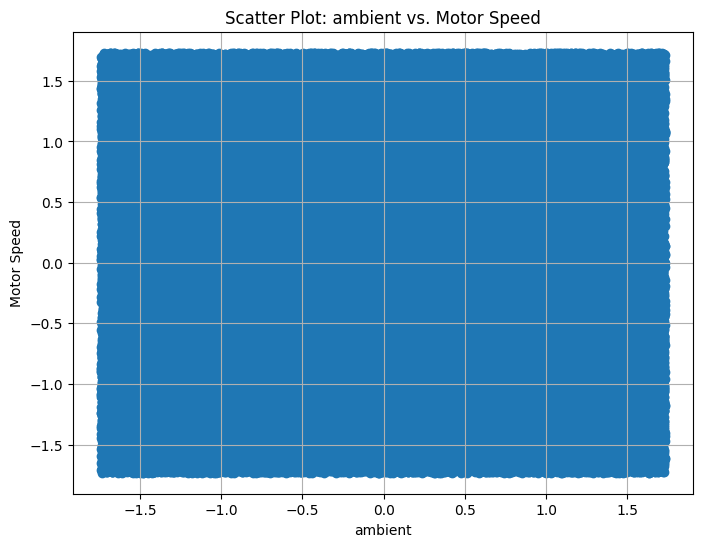

Correlation between ambient and Motor Speed: 0.00


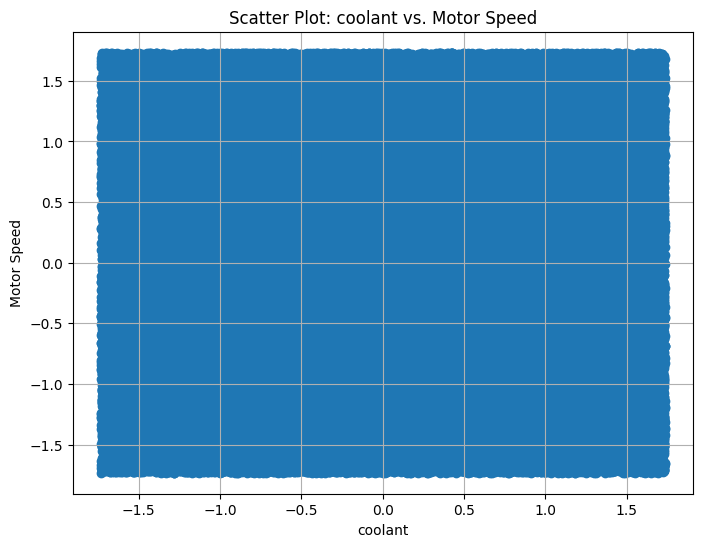

Correlation between coolant and Motor Speed: -0.00


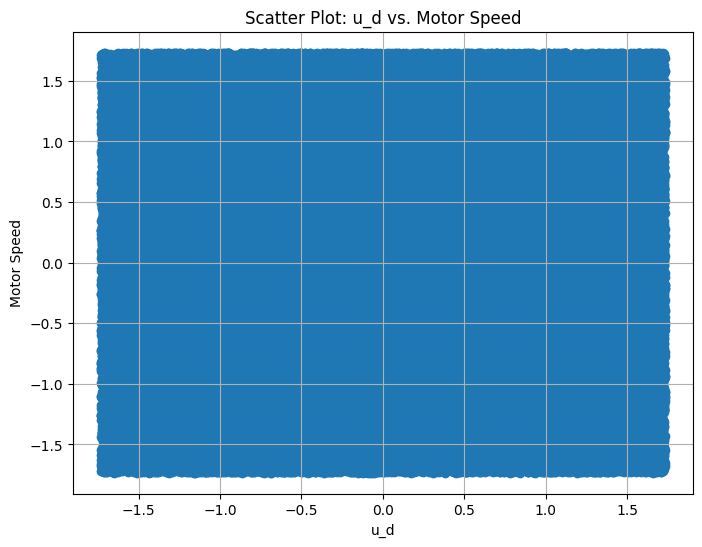

Correlation between u_d and Motor Speed: 0.00


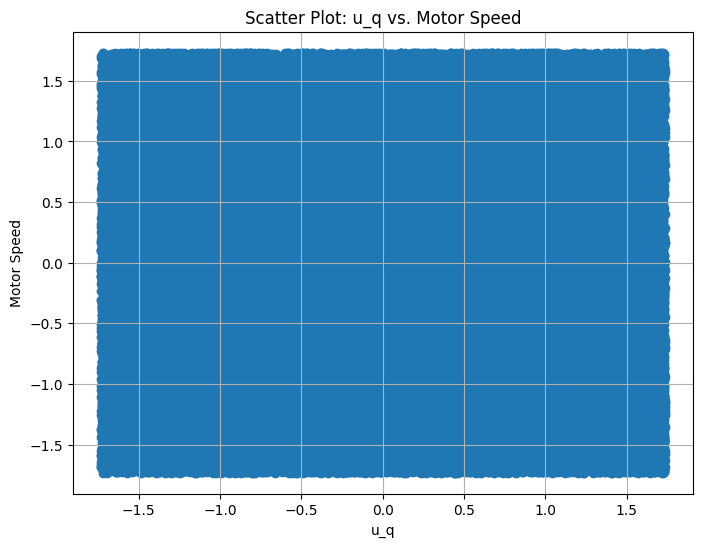

Correlation between u_q and Motor Speed: 0.00


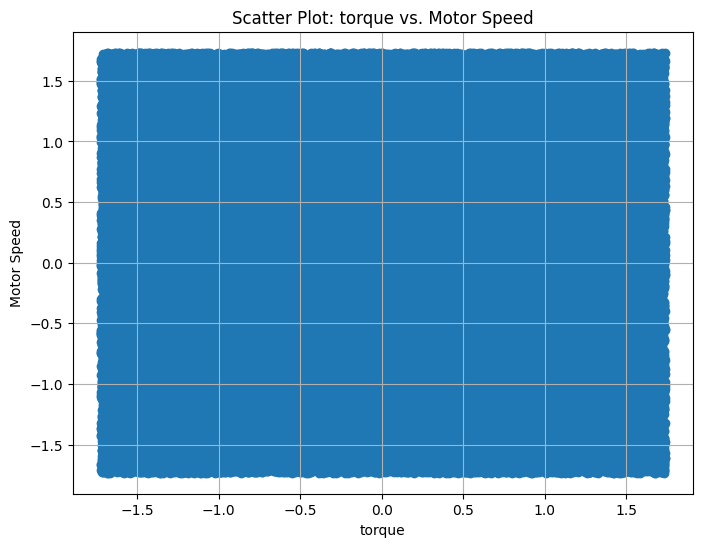

Correlation between torque and Motor Speed: -0.00


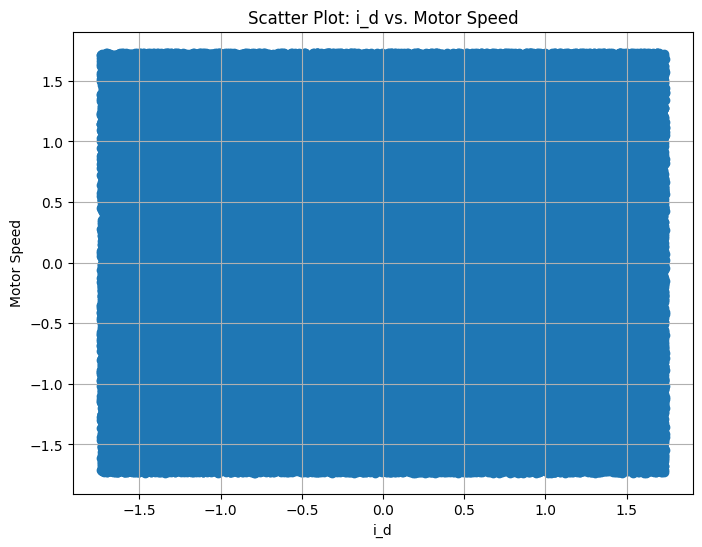

Correlation between i_d and Motor Speed: 0.00


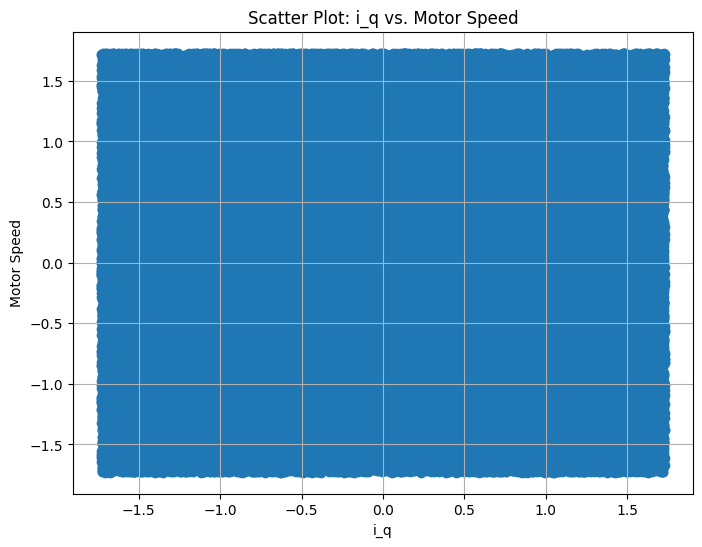

Correlation between i_q and Motor Speed: 0.00


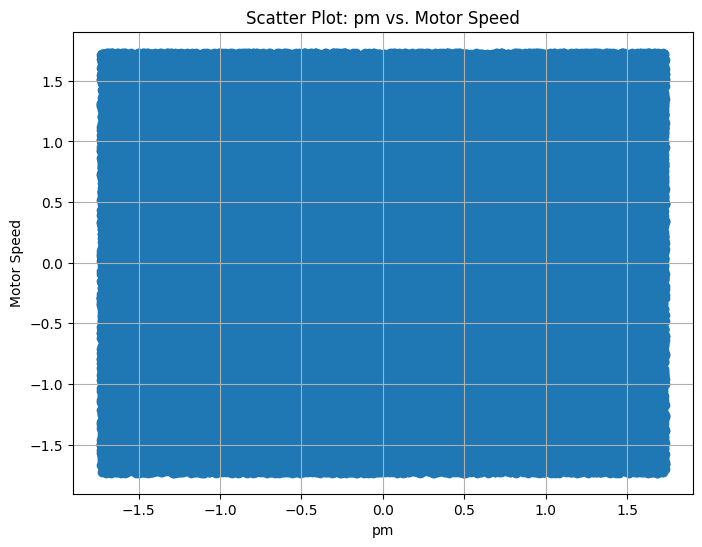

Correlation between pm and Motor Speed: 0.00


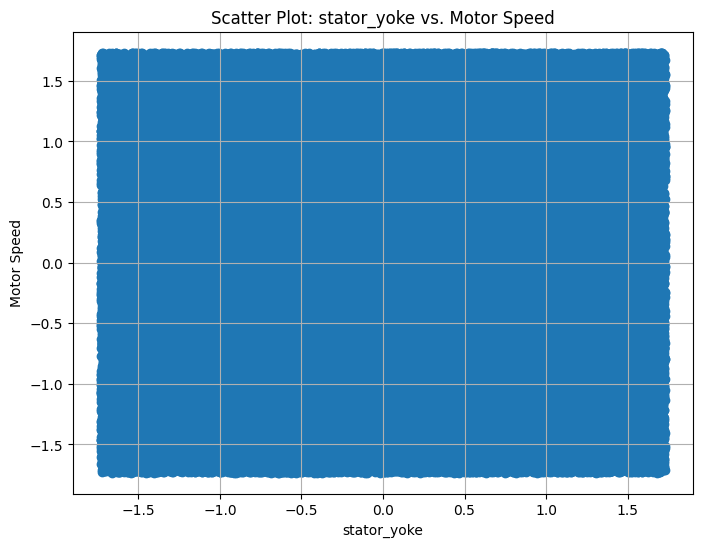

Correlation between stator_yoke and Motor Speed: 0.00


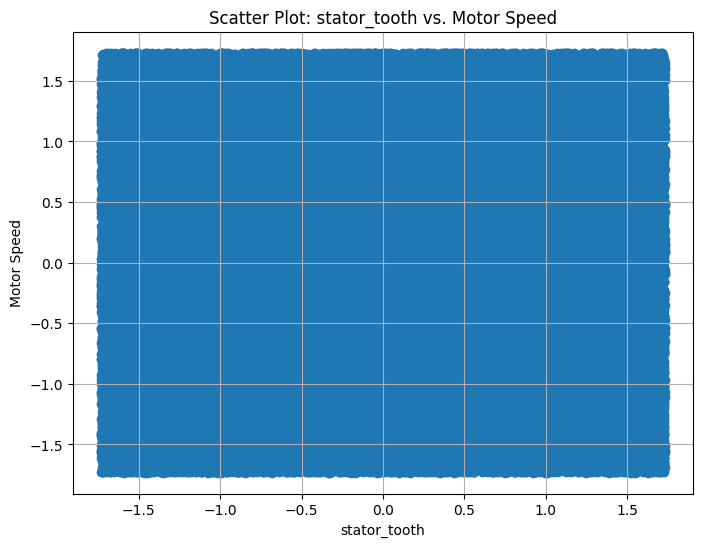

Correlation between stator_tooth and Motor Speed: -0.00


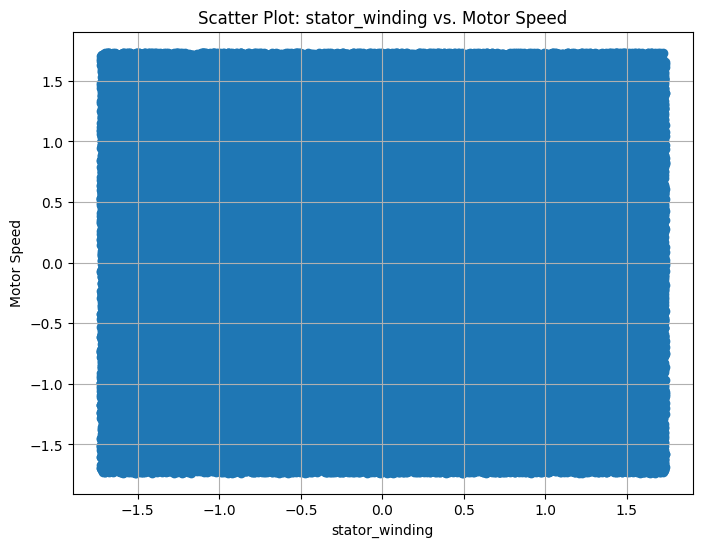

Correlation between stator_winding and Motor Speed: -0.00


In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# List of numerical features to analyze
numerical_features = ['ambient', 'coolant', 'u_d', 'u_q',
                     'torque', 'i_d', 'i_q', 'pm', 'stator_yoke',
                     'stator_tooth', 'stator_winding']

# Univariate analysis and visualization
for feature in numerical_features:
    # Scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(df[feature], df['motor_speed'])
    plt.xlabel(feature)
    plt.ylabel('Motor Speed')
    plt.title(f'Scatter Plot: {feature} vs. Motor Speed')
    plt.grid(True)
    plt.show()

    # Correlation coefficient
    correlation = df[feature].corr(df['motor_speed'])
    print(f"Correlation between {feature} and Motor Speed: {correlation:.2f}")


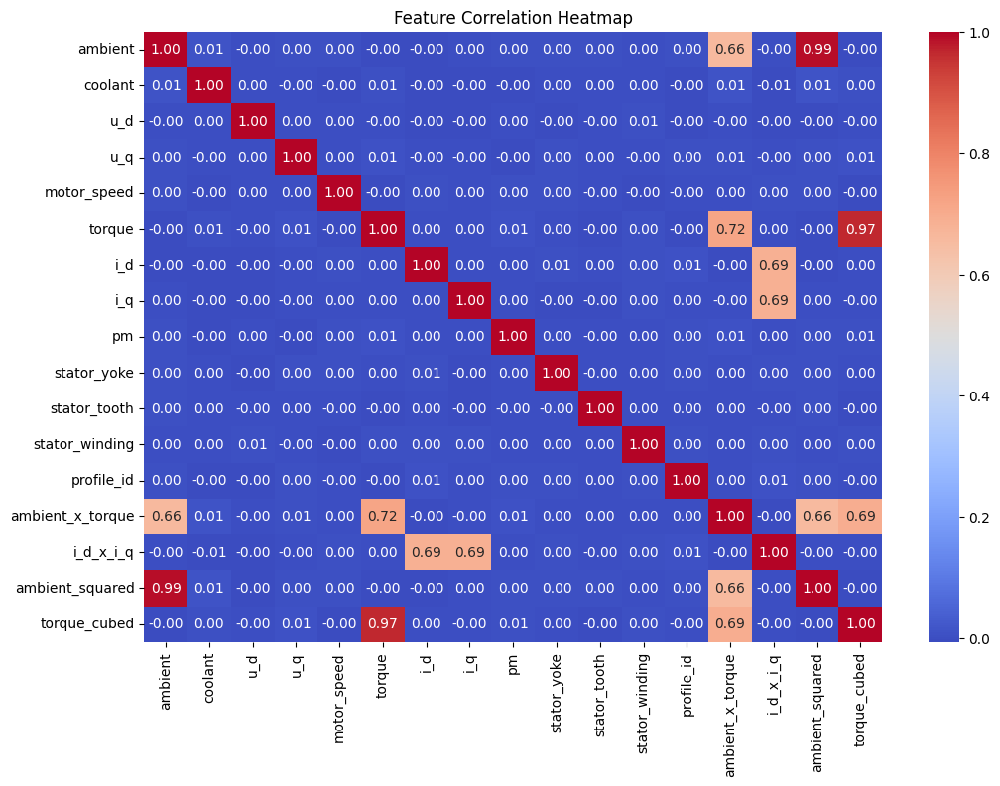

In [36]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()

In [37]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
X = df.drop(columns=['motor_speed'])
y = df['motor_speed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Decision Tree model
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = tree_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Decision Tree - Mean Squared Error: {mse:.4f}")
print(f"Decision Tree - R-squared: {r2:.4f}")

Decision Tree - Mean Squared Error: 2.0355
Decision Tree - R-squared: -1.0196


In [38]:

from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Fit the scaler to the selected columns and transform them
df[['ambient', 'motor_speed']] = scaler.fit_transform(df[['ambient', 'motor_speed']])

# Print the first few rows of the DataFrame to see the scaled values
print(df.head())

    ambient   coolant       u_d       u_q  motor_speed    torque       i_d  \
0  0.921340 -0.395356  1.698348  1.378399     0.503701 -1.226372 -0.950633   
1  0.969029  0.675303 -0.211159 -1.646159     0.797700  0.925751  0.505084   
2  0.813718  1.037289  1.239877 -0.069208     0.562187  1.447965 -1.335439   
3  0.420416 -0.118686  0.298131  0.672297     0.933701  0.860340  0.732070   
4  0.059674 -0.744676  0.918198  0.343135     0.857153  1.101686 -1.065759   

        i_q        pm  stator_yoke  stator_tooth  stator_winding  profile_id  \
0  0.991385 -1.674753     0.354509     -1.447938        1.714812         107   
1  1.023000  0.016429     0.313127     -1.131441       -0.328431         192   
2 -1.144165 -0.264342     0.977794      1.349288        0.759870         146   
3  1.052665  1.305878    -1.235982     -0.385327       -1.136328         135   
4  0.943943 -0.983900    -0.785712     -1.597712        0.076131         179   

   ambient_x_torque  i_d_x_i_q  ambient_squared  t

In [40]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score

# Create and train the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate the model
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost - Mean Squared Error: {mse_xgb:.4f}")
print(f"XGBoost - R-squared: {r2_xgb:.4f}")

XGBoost - Mean Squared Error: 1.0469
XGBoost - R-squared: -0.0387


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         100000 non-null  float64
 1   coolant         100000 non-null  float64
 2   u_d             100000 non-null  float64
 3   u_q             100000 non-null  float64
 4   motor_speed     100000 non-null  float64
 5   torque          100000 non-null  float64
 6   i_d             100000 non-null  float64
 7   i_q             100000 non-null  float64
 8   pm              100000 non-null  float64
 9   stator_yoke     100000 non-null  float64
 10  stator_tooth    100000 non-null  float64
 11  stator_winding  100000 non-null  float64
 12  profile_id      100000 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 9.9 MB
None
             ambient        coolant            u_d            u_q  \
count  100000.000000  100000.000000  100000.000000  100000.000000   
mean  

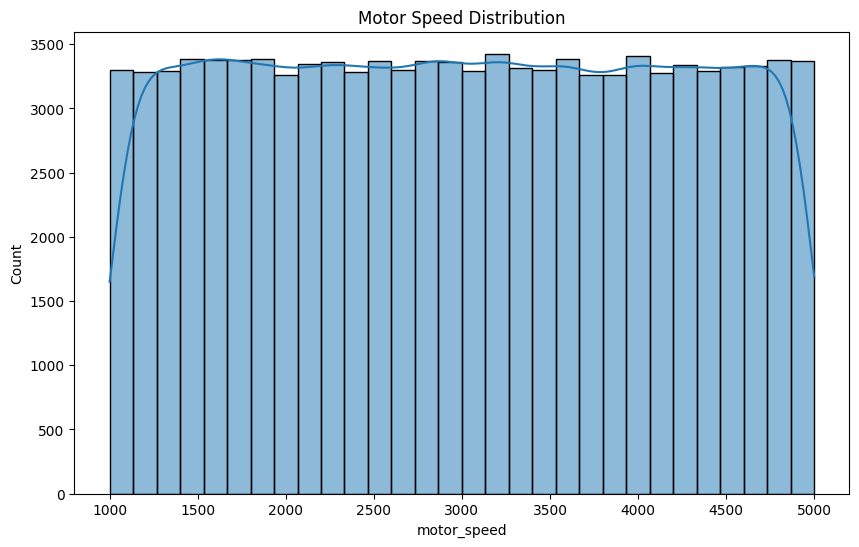

MAE: 1009.549969114187
MSE: 1361547.934913564
RMSE: 1166.8538618497023
R2 Score: -0.013170560703057665


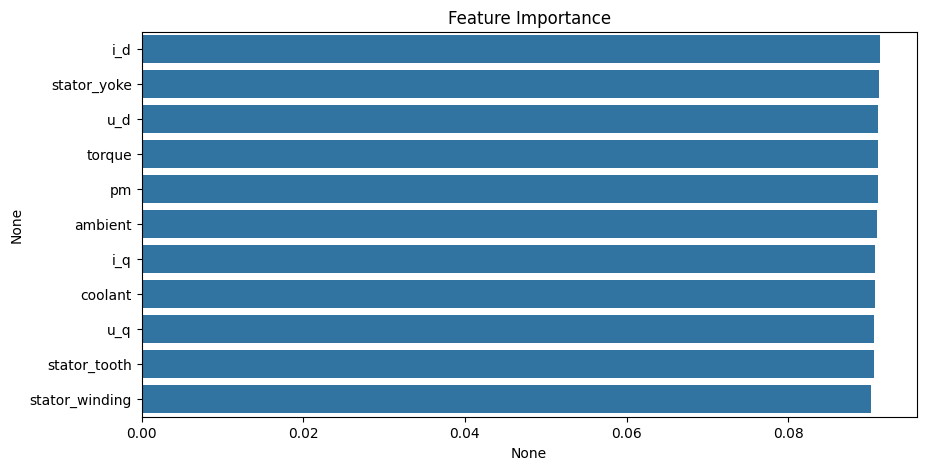

Model saved successfully!


In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load Dataset
df = pd.read_csv("/content/motor_data_100000_rows.csv")  # Change to actual file path

# Display basic info
print(df.info())
print(df.describe())

# Check for missing values
print(df.isnull().sum())

def visualize_data(df):
    """Function to plot feature distributions."""
    plt.figure(figsize=(10, 6))
    sns.histplot(df["motor_speed"], bins=30, kde=True)
    plt.title("Motor Speed Distribution")
    plt.show()

visualize_data(df)

# Feature Selection
features = ['ambient', 'coolant', 'u_d', 'u_q', 'torque', 'i_d', 'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding']
target = 'motor_speed'

X = df[features]
y = df[target]

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Model Training
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)

# Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

# Feature Importance
feature_importance = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)
plt.figure(figsize=(10, 5))
sns.barplot(x=feature_importance, y=feature_importance.index)
plt.title("Feature Importance")
plt.show()

# Save Model
import joblib
joblib.dump(model, 'motor_speed_model.pkl')
joblib.dump(scaler, 'scaler.pkl')

print("Model saved successfully!")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         100000 non-null  float64
 1   coolant         100000 non-null  float64
 2   u_d             100000 non-null  float64
 3   u_q             100000 non-null  float64
 4   motor_speed     100000 non-null  float64
 5   torque          100000 non-null  float64
 6   i_d             100000 non-null  float64
 7   i_q             100000 non-null  float64
 8   pm              100000 non-null  float64
 9   stator_yoke     100000 non-null  float64
 10  stator_tooth    100000 non-null  float64
 11  stator_winding  100000 non-null  float64
 12  profile_id      100000 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 9.9 MB
None
             ambient        coolant            u_d            u_q  \
count  100000.000000  100000.000000  100000.000000  100000.000000   
mean  

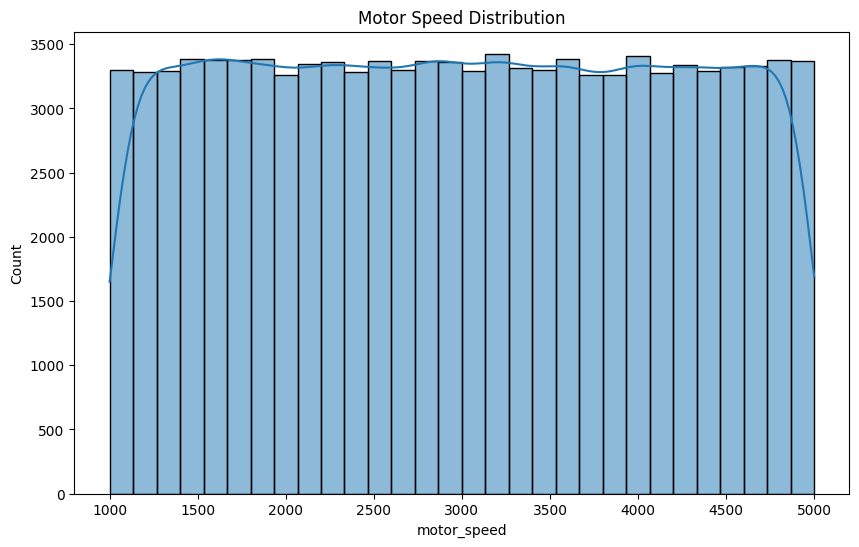

MAE: 1007.2852124109285
MSE: 1354071.9523084308
RMSE: 1163.6459737860268
R2 Score: -0.0076074473571217105
SVR Model saved successfully!


In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib

# Load Dataset
df = pd.read_csv("/content/motor_data_100000_rows.csv")

# Display basic info
print(df.info())
print(df.describe())

# Check for missing values
print(df.isnull().sum())

def visualize_data(df):
    """Function to plot feature distributions."""
    plt.figure(figsize=(10, 6))
    sns.histplot(df["motor_speed"], bins=30, kde=True)
    plt.title("Motor Speed Distribution")
    plt.show()

visualize_data(df)

# Feature Selection
features = ['ambient', 'coolant', 'u_d', 'u_q', 'torque', 'i_d', 'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding']
target = 'motor_speed'

X = df[features]
y = df[target]

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Model Training
model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)

# Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

# Save Model
joblib.dump(model, '/content/motor_speed_model.pkl')
joblib.dump(scaler, '/content/scaler.pkl')

print("SVR Model saved successfully!")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         100000 non-null  float64
 1   coolant         100000 non-null  float64
 2   u_d             100000 non-null  float64
 3   u_q             100000 non-null  float64
 4   motor_speed     100000 non-null  float64
 5   torque          100000 non-null  float64
 6   i_d             100000 non-null  float64
 7   i_q             100000 non-null  float64
 8   pm              100000 non-null  float64
 9   stator_yoke     100000 non-null  float64
 10  stator_tooth    100000 non-null  float64
 11  stator_winding  100000 non-null  float64
 12  profile_id      100000 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 9.9 MB
None
             ambient        coolant            u_d            u_q  \
count  100000.000000  100000.000000  100000.000000  100000.000000   
mean  

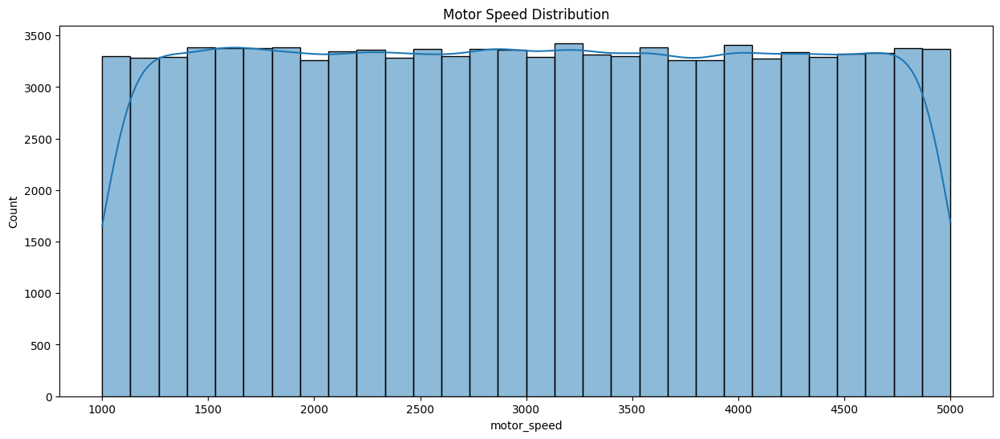

MAE: 1343.2455622381124
MSE: 2704037.3013316565
RMSE: 1644.3957252838065
R2 Score: -1.0121590422933586
Decision Tree Model saved successfully!


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib

# Load Dataset
df = pd.read_csv("/content/motor_data_100000_rows.csv")

# Display basic info
print(df.info())
print(df.describe())

# Check for missing values
print(df.isnull().sum())

def visualize_data(df):
    """Function to plot feature distributions."""
    plt.figure(figsize=(15, 6))
    sns.histplot(df["motor_speed"], bins=30, kde=True)
    plt.title("Motor Speed Distribution")
    plt.show()

visualize_data(df)

# Feature Selection
features = ['ambient', 'coolant', 'u_d', 'u_q', 'torque', 'i_d', 'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding']
target = 'motor_speed'

X = df[features]
y = df[target]

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Model Training
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)

# Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

# Save Model
joblib.dump(model, '/content/motor_speed_model.pkl')
joblib.dump(scaler, '/content/scaler.pkl')

print("Decision Tree Model saved successfully!")


Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
MAE: 1004.9426
MSE: 1343705.6223
R² Score: 0.0001


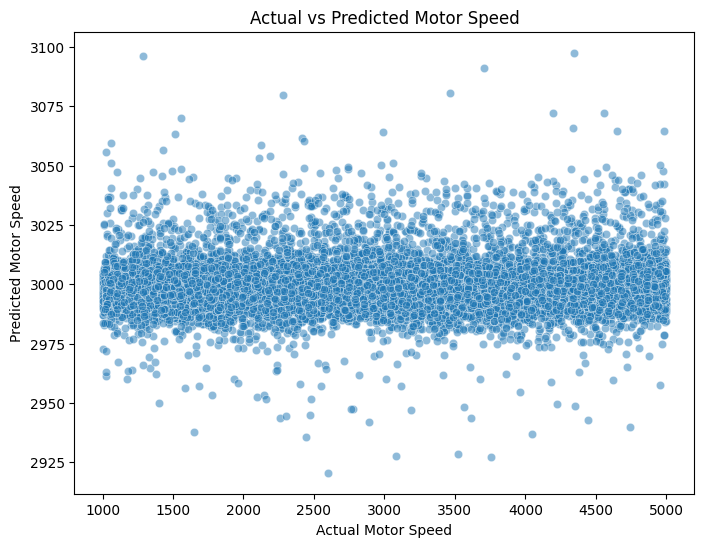

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load dataset
file_path = "/content/motor_data_100000_rows.csv"
df = pd.read_csv(file_path)

# Drop unnecessary columns
df.drop(columns=['profile_id'], inplace=True, errors='ignore')

# Handle missing values
df.fillna(df.mean(), inplace=True)

# Define features and target
X = df.drop(columns=['motor_speed'])  # Features
y = df['motor_speed']  # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define XGBoost model
xgb = XGBRegressor(objective='reg:squarederror')

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 1.0]
}

grid_search = GridSearchCV(xgb, param_grid, scoring='r2', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_

# Make predictions
y_pred = best_model.predict(X_test)

# Evaluate performance
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Best Parameters: {grid_search.best_params_}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"R² Score: {r2:.4f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Motor Speed")
plt.ylabel("Predicted Motor Speed")
plt.title("Actual vs Predicted Motor Speed")
plt.show()
